# COM3502-4502-6502 Speech Processing - Python Programming Assignment

## 1. General Information

This programming assignment is worth 55% of the overall course mark.

You are free to complete this assignment in your own time. However, feedback, advice and guidance is available during the lab classes and via the discussion board on Blackboard. 

Note: Via these channels we try to help you as much as possible, but will not debug your code or provide solutions to the assignment itself.

Note: It will take some time to complete this assignment, so plan your work accordingly over the coming weeks. Read these instructions carefully.

Note: Please be aware that students registered on COM4502 and COM6502 have **additional tasks** to perform. These are marked ‘COM4502-6502 Only’.

Note: You should always ensure that your results (e.g. in terms of plots you create) are clear to undrestand and leave no room for mis-interpretation. This can often easily achieved by adding proper $x$- and $y$-axis labels, titles, legends etc. Where results are not clear to interprete, this might result in missed points. 


## 1.1 Student Data

Student Family Name: <span style="font-weight:bold;color:orange">**Barker**</span>

Student Given Name(s): <span style="font-weight:bold;color:orange">**Ethan**</span>

Date of submission: <span style="font-weight:bold;color:orange">16/12/2022</span>

Academic Year 2021/2022

## 1.2 Copyright

This programming assignment is part of the lecture COM[3502](http://www.dcs.shef.ac.uk/intranet/teaching/public/modules/level3/com3502.html "Open web page for COM3502 module")-[4502](http://www.dcs.shef.ac.uk/intranet/teaching/public/modules/level4/com4502.html "Open web page for COM4502 module")-[6502](http://www.dcs.shef.ac.uk/intranet/teaching/public/modules/msc/com6502.html "Open web page for COM4502 module") Speech Processing at the [University of Sheffield](https://www.sheffield.ac.uk/ "Open web page of The University of Sheffield"), Dept. of [Computer Science](https://www.sheffield.ac.uk/dcs "Open web page of Department of Computer Science"), University of Sheffield.

This notebook is licensed as an assignment to be used during the lecture COM3502-4502-6502 Speech Processing at the University of Sheffield. Any further use is only permitted if agreed with the [module lead](mailto:s.goetze@sheffield.ac.uk).

It should be a matter of course that rules of [unfair means](https://www.sheffield.ac.uk/apse/apo/quality/assessment/unfair) apply and the assignment is not to be shared with or made available to other persons besides those participating in the module during the same academic year. This includes publishing on web pages etc. All questions can be asked during the lab classes or using the Blackboard Discussion board.


## 1.3 Hand-In Procedure and Deadline

Once you have completed the assignment you should submit a `.zip` file (via Blackboard) containing your solution (as a file named `YourName.ipynb`) and possibly other source linked in your Jupyter Notebook. Also the `.zip` filename should be of the form `YourName.zip`. Please make also sure that your name is entered correctly in the section above.

Standard departmental penalties apply for [late hand-in](https://sites.google.com/sheffield.ac.uk/comughandbook/general-information/assessment/late-submission) and [plagiarism](https://sites.google.com/sheffield.ac.uk/comughandbook/general-information/assessment/unfair-means).

The **deadline** for handing-in this assignment (via Blackboard) is 
<span style="font-weight:bold;color:red">**Friday 16th December 2022**</span>

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task 0:**
    
Ensure that you data is correctly entered in the section at the top of this sheet and that the filename is in the form `YourName.ipynb`. 
    
</div>

## 1.4 Libraries

You should be familar to the use of the following Python libraries from the lab. You should not need to use additional ones. You are allowed to use additional libraries if necessary for your code. If they need to be installed by `!pip install <libraryname>` or `!conda install <libraryname>`, please indicate this as a comment in your code. You should not make use of libraries that can't be installed by either `!pip install` or `!conda install`. You have to ensure that your Notebook runs "out of the box". You can test this on the Computer Lab machines in the Diamond if you are unsure and using your own computer.

In [83]:
#Let's do some necessary and nice-to-have imports
%matplotlib inline
import matplotlib.pyplot as plt    # plotting
#import seaborn as sns; sns.set()  # styling
import numpy as np                 # math

import soundfile as sf             # to load files
from IPython import display as ipd # for sound playback

from scipy import signal as sig           # filter designs (if not already imported)

## 2. Download, load, and analyse audio

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T1:** 
    
* Load a wave file containing speech. You can find a file at <a href="https://staffwww.dcs.shef.ac.uk/people/S.Goetze/sound/speech.wav"> https://staffwww.dcs.shef.ac.uk/people/S.Goetze/sound/speech.wav</a> and should be able to download this. You can also use your own WAVE files if you prefer this. If you want to record WAVE files and are using your own computer, the program [Audacity](https://www.audacityteam.org/download/) is one possibility to [record WAVE files](https://manual.audacityteam.org/man/basic_recording_editing_and_exporting.html).
    
* Visualise the signal in time domain, in the spectral domain (as spectrum) and as a time-frequency representation (spectrogram). Please ensure proper axis labels for all your plot in this assignment.

* Playback the signal.
    
</div>

In [84]:
def nextPowerOf2(L):
    '''
    Calculates the smallest power of 2 which is bigger than the length of input variable L
    
    This helper function can be used to calculate an appropriate 
    length for an DFT which is longer than the signal length L and is a power of 2.
    
    Input:
        L: int
            signal length
    Output:
        p: integer which is greater or equal than n and a power of 2
    
    Examples:
        for L in range(20):
            print('nextPowerOf2(L) for L='+str(L)+' is '+str(nextPowerOf2(L)))
            
        x=ones(11)
        L_FFT=nextPowerOf2(len(x))
    '''
    return int(np.max([2,2**np.ceil(np.log2(L))]))

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1812k  100 1812k    0     0   967k      0  0:00:01  0:00:01 --:--:--  967k
1048576


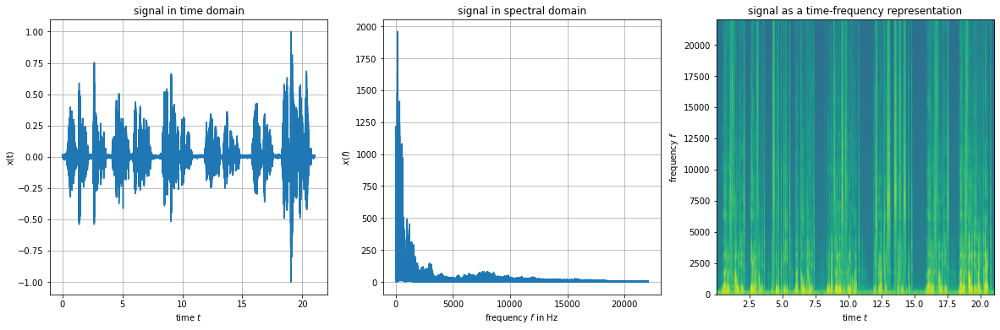

In [85]:
#download
file_name = 'speech.wav'
!curl https://staffwww.dcs.shef.ac.uk/people/S.Goetze/sound/{file_name} -o {file_name}

#load 
s,fs = sf.read(file_name)
length = 21

t = np.linspace(0,len(s)/fs,len(s))


FFT_length = nextPowerOf2(fs*length) # take a power of two which is larger than the signal length
print(FFT_length)
spectrum = np.abs(np.fft.rfft(s,n=FFT_length))

f = np.linspace(0, fs/2, num=int(FFT_length/2+1))

fig=plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
plt.plot(t,s)
plt.title('signal in time domain')
plt.xlabel('time $t$')
plt.ylabel('x(t)')
plt.grid()

plt.subplot(1,3,2)
plt.plot(f,spectrum)
plt.title('signal in spectral domain')
plt.xlabel('frequency $f$ in Hz')
plt.ylabel('$x(f)$')
plt.grid()

plt.subplot(1,3,3)
plt.specgram(s, Fs=fs);
plt.title('signal as a time-frequency representation')
plt.xlabel('time $t$')
plt.ylabel('frequency $f$')


ipd.Audio(s, rate=fs)

<br>
<div style="border: 2px solid #999; padding: 10px; background: #9696ff;">
    
**Question Q1:** 

* Determine the sampling frequency $f_s$ in Hz and the length of the signal in seconds. What is the sampling interval $T_s$ of your signal? What is the highest occuring frequency?
    
Note: You can either give your answer in form of a code block (e.g. by using the `print()` functions) or as text. For the latter, change the [type of the next cell](https://jupyter-notebook.readthedocs.io/en/stable/notebook.html#structure-of-a-notebook-document) from `code` to `markdown` or use the yellow example text below.
    
</div>

In [86]:
print('The sampling frequency is ' + str(fs) + ' Hz and the length of the signal is ' + str(length) + " seconds. The sampling interval is " + str(1/fs) + " seconds and the highest occuring freuqnecy is " +str(fs/2)+ " Hz")

The sampling frequency is 44100 Hz and the length of the signal is 21 seconds. The sampling interval is 2.2675736961451248e-05 seconds and the highest occuring freuqnecy is 22050.0 Hz


<span style="font-weight:bold;color:orange">In case you want to answer by written text, we would appreciate if you  colour-code your answers, e.g. like using orange font colour as illustrated in this example. This helps us, not to overlook parts of your answers.</span>

## 3. Piece-wise linear filtering in the time domain

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T2:** 
    
* Design a high-pass filter with a cut-off frequency of $\approx 500$ Hz using a filter design method of your choice. 
* Design a low-pass filter with a cut-off frequency of $\approx 500$ Hz.
* Design a band-stop filter with a cut-off frequencies of $\approx 300$ Hz and of $\approx 1.1$ kHz.
* Simulate the effect of a land-line telephone by eliminating all energy below $300$ Hz and above $3,400$ Hz.
* Visualise the transfer functions of the filters and the zero-pole plots.
* Apply the designed filters, compare filter input and output as a time-frequency visualisation and play back the filtered signal.
    
Note: Don't forget proper labeling / description of your figures to make clear what is what.
    
Note: In case you encounter stability problems, rememer that we mentioned in the lecture, that filters can be designed as second-oder-systems (SOS) which the design methods you are familia with can realise.
</div>

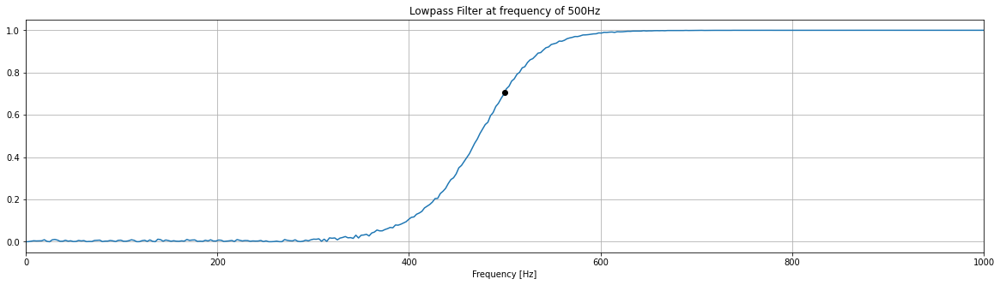

In [87]:
cutoff = 500
b, a = sig.butter(10, cutoff, fs = fs, btype= 'high', analog = False)
w, h = sig.freqz(b, a, fs = fs, worN = 8000)
fig=plt.figure(figsize=(20,5))
plt.title('Lowpass Filter at frequency of 500Hz')
plt.xlabel('Frequency [Hz]')
plt.plot(w, np.abs(h))
plt.xlim(0,1000)
plt.plot(cutoff, 0.5*np.sqrt(2), 'ko-')
plt.grid()


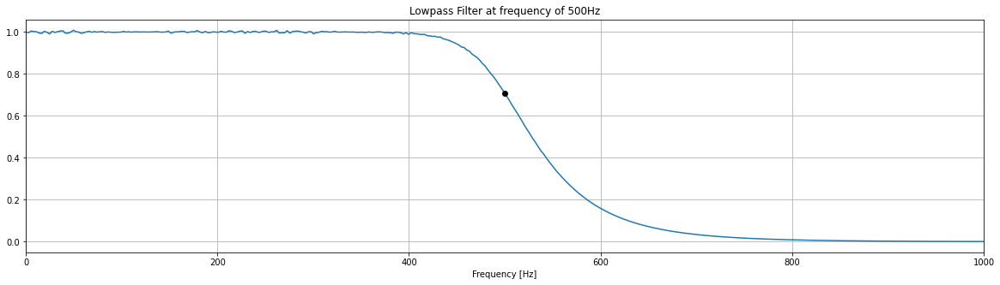

In [88]:
cutoff = 500
b, a = sig.butter(10, cutoff, fs = fs, btype= 'low', analog = False)
w, h = sig.freqz(b, a, fs = fs, worN = 8000)
fig=plt.figure(figsize=(20,5))
plt.title('Lowpass Filter at frequency of 500Hz')
plt.xlabel('Frequency [Hz]')
plt.plot(w, np.abs(h))
plt.xlim(0,1000)
plt.plot(cutoff, 0.5*np.sqrt(2), 'ko-')
plt.grid()


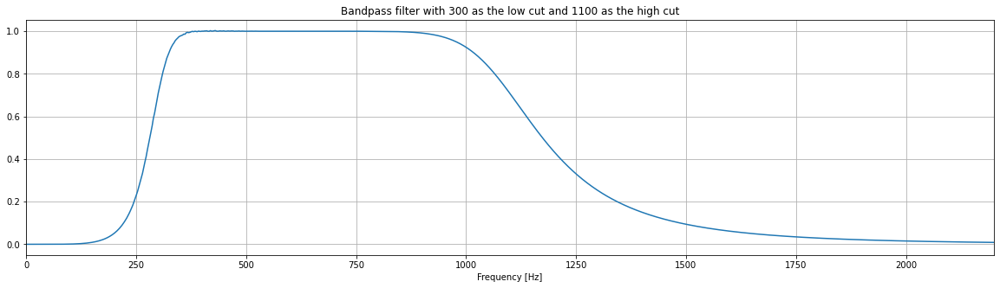

In [89]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    return sig.butter(order, [lowcut, highcut], fs=fs, btype='band')

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = sig.lfilter(b, a, data)
    return y

lowcut = 300
highcut = 1100
b, a = butter_bandpass(lowcut, highcut, fs, order=5)
w, h = sig.freqz(b, a, fs=fs, worN=8000)
fig=plt.figure(figsize=(20,5))
plt.plot(w, abs(h))
plt.title('Bandpass filter with 300 as the low cut and 1100 as the high cut')
plt.xlabel('Frequency [Hz]')
plt.xlim(0,2200)
plt.grid()

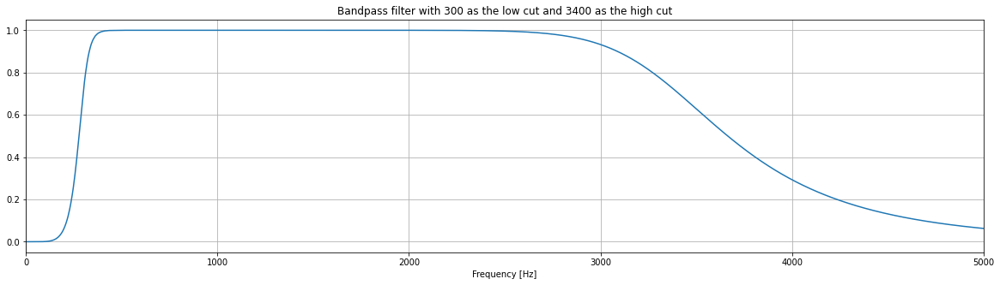

In [90]:
lowcut = 300
highcut = 3400
b, a = butter_bandpass(lowcut, highcut, fs, order=6)
w, h = sig.freqz(b, a, fs=fs, worN=8000)
fig=plt.figure(figsize=(20,5))
plt.plot(w, abs(h))
plt.title('Bandpass filter with 300 as the low cut and 3400 as the high cut')
plt.xlabel('Frequency [Hz]')
plt.xlim(0,5000)
plt.grid()

<br>
<div style="border: 2px solid #999; padding: 10px; background: #9696ff;">
    
**Question Q2:** 

* Explain the behaviour of the designed band-stop filter, i.e. describe (briefly) what you can see in the generated plots. If you didn't generate plots you can explain what you would expect to see.

    
</div>

**Answer to Question Q2:**

<span style="font-weight:bold;color:orange">
    ...your answer here ...
</span>

<br>
<div style="border: 2px solid #999; padding: 10px; background: #9696ff;">
    
**Question Q3:**
    
* Which sounds are most affected when the low-pass cut-off frequency is set to around $500$
Hz - vowels or consonants - and why?
    
</div>

**Answer to Question Q3:**

<span style="font-weight:bold;color:orange">
    ...your answer here ...
</span>

## 4. Audio Effects

### 4.1 Low Frequency Oscillator

Many ‘Voice effects (FX)’ are achieved by modifying some characteristic of the speech using a low frequency oscillator or *LFO*. LFOs typically have two controls: speed (which is specified by the frequency in Hertz) and depth (which specifies the magnitude of the effect). The following tasks will require several LFOs, so it makes sense to implement one in the following.

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T3:**
    
* Implement a Low Frequency Oscillator as a function `lfo()` as described below. Visualise that your function works be generating a sine and a square wave of frequency $5$ Hz and length $2$ seconds with different depths.
    
Note: There will be an extra point in the marking if you **do not** use the `scipy` library to solve this task.
    
</div>

In [91]:
def lfo(speed_hz, depth, num_samples, fs=44100, square_curve=False):
    '''
    Low-frequency oscillator
    
    Parameters
    ----------
    speed_hz : float
       frequency of generated signal in Hertz
    depth : float
        magnitude of the effect
    num_samples : int
        length of the signal in samples
    fs : float, optional 
        sampling frequency in Hz, default 44100
    square_curve : boolean, optional (default: False)
        generate square wave if true, generate sine wave if false

    Example use:
    -------
        sig_square = lfo(speed_hz=5, depth=0.7, num_samples=88200, fs=44100, square_curve=True)
    '''
    dt = 1/fs
    StopTime = num_samples / fs
    t = np.arange(0,StopTime,dt)

    x = depth*np.sin(2*np.pi*speed_hz*t) 
    if square_curve == True:
      x = np.where(x>0, depth, -depth)
      #y = depth*np.sin(2*np.pi*speed_hz*t) 
    return x    



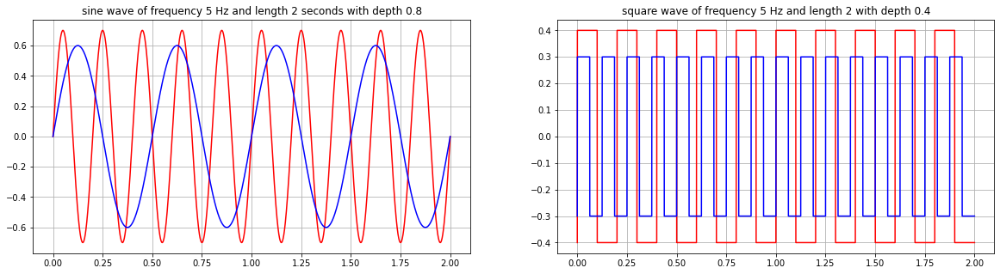

In [92]:
sig_sin = lfo(speed_hz=5, depth=0.7, num_samples=88200, fs=44100, square_curve=False)
sig_sin2 = lfo(speed_hz=2, depth=0.6, num_samples=88200, fs=44100, square_curve=False)
sig_square = lfo(speed_hz=5, depth=0.4, num_samples=88200, fs=44100, square_curve=True)
sig_square2 = lfo(speed_hz=8, depth=0.3, num_samples=88200, fs=44100, square_curve=True)

num_samples=88200
dt = 1/fs
StopTime = num_samples / fs
t = np.arange(0,StopTime,dt)

fig=plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.title('sine wave of frequency 5 Hz and length 2 seconds with depth 0.8')
plt.plot(t,sig_sin,"red")
plt.plot(t,sig_sin2,"blue")
plt.grid()
plt.subplot(1,2,2)
plt.title('square wave of frequency 5 Hz and length 2 with depth 0.4')
plt.plot(t,sig_square,"red")
plt.plot(t,sig_square2,"blue")
plt.grid()

Although your function outputs audio, you are unlikely to be able to hear it as the frequency is so low. However, you can check that it is functioning correctly by combining is with other audio signals as we will do in the following.

### 4.2 Amplitude Modulation - Tremolo

*Tremolo* is one of the most basic voice manipulations that makes use of an LFO. In this effect, the amplitude of a speech signal is [modulated](https://en.wikipedia.org/wiki/Amplitude_modulation), i.e. the speech waveform is multiplied by a variable gain that ranges between $0$ and $1$. 

Your LFO outputs an audio signal between `-depth` and `+depth`. So, in order to modulate the amplitude of the speech correctly, the output of the LFO has to be scaled appropriately to range between $0$ and $1$.

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T4:**
    
* Implement  a function `tremolo()` using your function `lfo()` and modulate the amplitude of the speech signal. 
* Experiment with different settings for `speed` and `depth`. In particular, note that a square wave with speed between $3$ and $4$ Hz (and depth = $1$) has a very destructive effect on the intelligibility of the output. This is because $3-4$ Hz corresponds to the typical syllabic rate of speech.
* Proof that the effect works by a proper visualisation of the filtered speech signal and describe what can be observed and perceived.
    
</div>

In [93]:
def tremolo(signal, fs, speed_hz, depth, square_curve=False):
    '''
    Applies a tremolo effect to a signal
    
    Parameters
    ----------
    signal : float
       input signal to which the effect should be applied
    fs : int
        sampling frequency in Hz
    speed_hz : float
       frequency of LFO and by this also the effect
    depth : float
        magnitude of the effect
    square_curve : boolean, optional
        generate square wave if true, generate sine wave if false
    
    Return
    ----------
    signal after application of tremolo effect
    
    Example use:
    -------
        signal_tremolo = tremolo(audio_in, fs, 10, 1, square_curve=False)
    '''
    generated_signal = lfo(speed_hz, depth, 928086, fs)
    if square_curve:
        generated_signal = np.sign(generated_signal)
    # apply effect
    signal_out = signal * (1 + depth * generated_signal)
    return signal_out
   

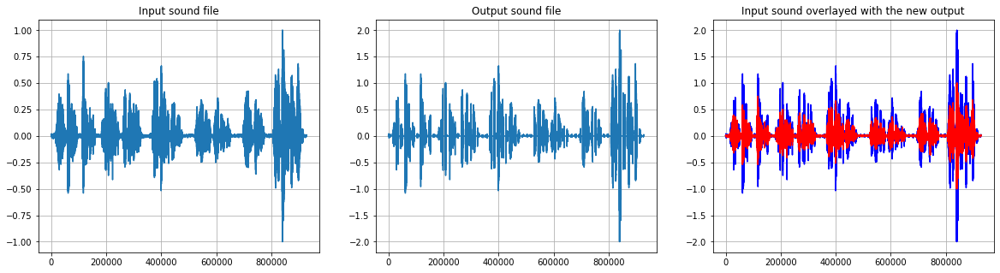

In [113]:
signal_tremolo = tremolo(s, fs, 3, 1, square_curve=True)
t = np.arange(0,StopTime,dt)

fig=plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.title('Input sound file')
plt.plot(s)
plt.grid()
plt.subplot(1,3,2)
plt.title('Output sound file')
plt.plot(signal_tremolo)
plt.grid()
plt.subplot(1,3,3)
plt.title('Input sound with the new output to show the difference')
plt.plot(signal_tremolo, "blue")
plt.plot(s, "red")
plt.grid()
ipd.Audio(signal_tremolo, rate = fs)



### 4.3 Ring Modulation

Another basic effect is to multiply the speech signal by the output of an LFO. This is known as ‘ring modulation’.

Note: In the BBC TV series [Dr. Who](https://en.wikipedia.org/wiki/Doctor_Who), the voices of the alien [Daleks](https://en.wikipedia.org/wiki/Dalek) are generated by a ring modulator with an LFO set to around 30 Hz. The voice actors also spoke using a stilted monotonic intonation in order to enhance the effect. You can try this yourself by recording your own voice and applying the effect.

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T5 (Ring Modulation):**
    
* Implement  a function `ring_modulation()` using your function `lfo()` and modulate the amplitude of the speech signal by multiplying with the LFO signal. 
* Experiment with different settings for `speed` and `depth`. Note how the timbre of the resulting sound is subtly different from *tremolo*.
* Proof that the effect works by a proper visualisation of the filtered speech signal and describe what can be observed and perceived.
    
</div>

In [95]:
def ring_modulation(signal, fs, speed_hz, depth, square_curve=False):
    '''
    Applies a ring modulation effect to a signal
    
    Parameters
    ----------
    signal : float
       input signal to which the effect should be applied
    fs : int
        sampling frequency in Hz
    speed_hz : float
       frequency of LFO and by this also the effect
    depth : float
        magnitude of the effect
    square_curve : boolean, optional
        generate square wave if true, generate sine wave if false
    
    Return
    ----------
    signal after application of the ring modulation effect
    
    Example use:
    -------
        signal_ring_mod = ring_modulation(audio_in, fs, 10, 1, square_curve=False)
    '''
    modulated = lfo(speed_hz, depth, 928086, fs, square_curve)
    output_signal = modulated * signal
    return output_signal



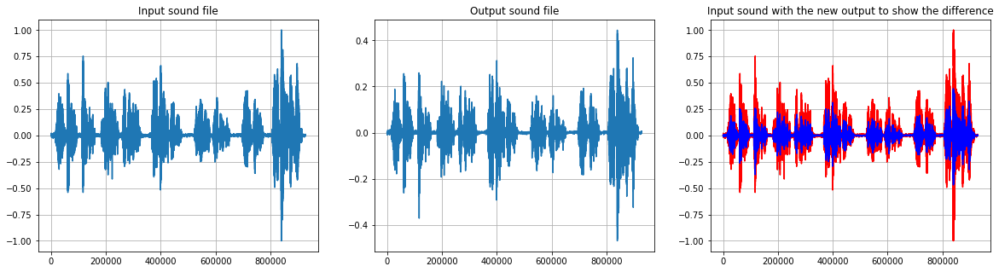

In [114]:
signal_modulated = ring_modulation(s,fs,30,0.5,False)

fig=plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.title('Input sound file')
plt.plot(s)
plt.grid()
plt.subplot(1,3,2)
plt.title('Output sound file')
plt.plot(signal_modulated)
plt.grid()
plt.subplot(1,3,3)
plt.title('Input sound with the new output to show the difference')
plt.plot(s, "red")
plt.plot(signal_modulated, "blue")
plt.grid()
ipd.Audio(signal_modulated, rate = fs)

### 4.4 Frequency Shifting

Many Vocal FX are the result of altering the frequencies present, e.g. changing the pitch of a voice. There are many algorithms for frequency shifting. You have already implemented an approximate solution with your ring modulator.

For simplicity, the following function will be givem implementing frequency shifting.

In [97]:
# the following code in this cell is taken and slightly adapted from:
# https://gist.github.com/lebedov/4428122

import scipy.signal as sig

def nextpow2(n):
    '''Return the first integer N such that 2**N >= abs(n)'''
    return int(np.ceil(np.log2(np.abs(n))))

def frequency_shift(signal, fs, shift_amount):
    '''
    Shift the specified signal by the specified frequency.
    
    Parameters
    ----------
    signal : float
       input signal to which the effect should be applied
    fs : int
        sampling frequency in Hz
    shift_amount : float
       amount of frequency shift (in Hz)
   
    Return
    ----------
    signal after application of the frequancy shifting effect
    
    Example use:
    -------
        signal_frequency_shifted = frequency_shift(audio_in, fs, 100)
    '''

    # Pad the signal with zeros to prevent the FFT invoked by the transform from
    # slowing down the computation:
    N_orig = len(signal)
    N_padded = 2 ** nextpow2(N_orig)
    t = np.arange(0, N_padded)
    return (
        sig.hilbert(
            np.hstack((signal, np.zeros(N_padded - N_orig, signal.dtype)))
        )
        * np.exp(2j * np.pi * shift_amount * t / fs)
    )[:N_orig].real

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T6 (Frequency Shifting):**
    
* Visualise the effect of the frequency shift effect using an appropriate spectral representation.
    
</div>

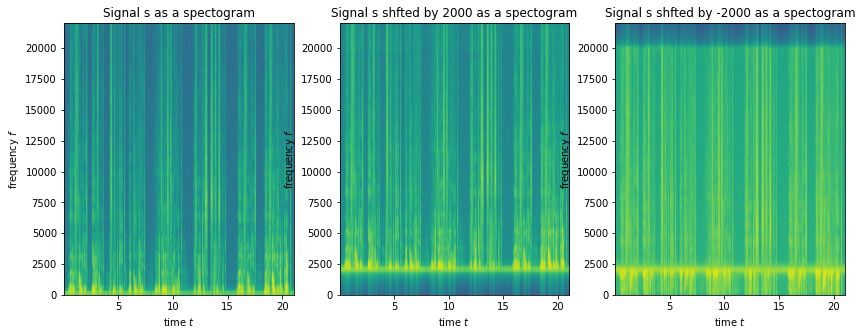

In [98]:
signal_frequency_shifted = frequency_shift(s, fs, 2000)
signal_frequency_shifted2 = frequency_shift(s, fs, -2000)

fig=plt.figure(figsize=(14,5))
plt.subplot(1,3,1)
plt.title('Signal s as a spectogram')
plt.xlabel('time $t$')
plt.ylabel('frequency $f$')
plt.specgram(s, Fs=fs);
plt.subplot(1,3,2)
plt.title('Signal s shfted by 2000 as a spectogram')
plt.xlabel('time $t$')
plt.ylabel('frequency $f$')
plt.specgram(signal_frequency_shifted, Fs=fs);
plt.subplot(1,3,3)
plt.title('Signal s shfted by -2000 as a spectogram')
plt.xlabel('time $t$')
plt.ylabel('frequency $f$')
plt.specgram(signal_frequency_shifted2, Fs=fs);
ipd.Audio(signal_frequency_shifted, rate = 44100)

<br>
<div style="border: 2px solid #999; padding: 10px; background: #9696ff;">
    
**Question Q4:**

* COM3502-4502-6502: Why can the voice be shifted up in frequency much further than
it can be shifted down in frequency before it becomes severely distorted? Hint: Calculate a spectrum plot if the answer is not immediately clear to you.
* COM4502-6502 ONLY: Your frequency shifter changes all the frequencies present in an input signal. How might it be possible to change the pitch of a voice without altering the formant frequencies?
    
</div>

**Answer to Question Q4:**

<span style="font-weight:bold;color:orange">
    ...your answer here ...
</span>

### 4.5 Harmony Effect

A classic ‘robotic’ voice can be achieved by simply adding frequency-shifted speech back to the unprocessed original. This effect is known as ‘harmony’. However, rather than simply adding the signals in equal amounts, we will implement a more general purpose approach.

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T7:**
    
* Implement a function `mixer()` that adds the original speech with the manipulated speech in different proportions. 
* Implement a function `harmony()` mixes the input signal with a frequency shifted version of itself (using the funtions `mixer()` and `frequency_shift()`). With your mixer at the 50-50 setting, experiment with different frequency shifts in order to produce the best robotic sounding output. Report "your optimal" setting. 
</div>

In [99]:
def mixer(signal1, signal2, percentage_l=0.5):
  output = ((1-percentage_l)*signal1) + (percentage_l*signal2)
  return output



In [100]:
def harmony(signal1):
  audio_in = signal1
  signal_frequency_shifted = frequency_shift(audio_in, fs, 80)
  audio_out = mixer(signal_frequency_shifted,signal_frequency_shifted,percentage_l = 0.5)
  return audio_out



In [101]:
x = harmony(s)
ipd.Audio(x, rate=fs)

**Answer to question in Task T7:**

<span style="font-weight:bold;color:orange">
    ...your answer here ... <br>
  My optimal setting is ..... <br>
    because .....
</span>

### 4.6 Frequency Modulation: Vibrato

Now that you have the ability to shift the frequencies in a speech signal, it is very easy to implement another common voice manipulation technique - *vibrato*. All that is required is for the frequency shifter to be controlled by the output of an LFO.



<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T8:**
    
* Implement a function `vibrato()` by connecting an LFO to your frequency shifter, and experiment with different values for speed and depth . Note that the LFO output will need to be scaled to provide an appropriate frequency shift range and then added to the output of the frequency shift.
    
</div>



In [115]:
def vibrato(signal, speed_hz, depth, num_samples, square_curve):
  vibrato_signal = frequency_shift(lfo(speed_hz, depth, 928086, fs, square_curve),fs,100)
  return vibrato_signal


In [116]:
vibrato_signal = vibrato(s, fs, 0.1, num_samples, False) 
ipd.Audio(vibrato_signal, rate =fs)

### 4.7 Time Delay Effect - Echo and Comb Filter

Many interesting voice FX can be achieved by delaying the signal and recombining it with itself. 

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T9:**
    
* Implement a function `echo()` which mixes a signal $s(t)$ with itself in a delayed version, i.e. $s(t-t_0)$. Experiment with various values for the delay $t_0$, and note the different effects you can achieve with delays 
  * below $20$ msecs
  * between $20$ and $100$ msecs, and 
  * above $100$ msecs.
</div>

In [104]:
def echo(signal,delay,fs):
  filt = np.zeros(int(delay*fs+1))
  filt[0] = 1
  filt[int(delay*fs)] = 0.7
  signal2 = np.convolve(signal,filt,'same')
  return signal2



In [105]:
echo_sig = echo(s,0.1,fs)
ipd.Audio(echo_sig, rate=fs)

### 4.8 Comb Filtering 

You should observe that, with delays below $20$ msec in your function `echo()`, the signals combine to create a subtle ‘phasing’ effect. This is known as ‘comb filtering’ as the signal is effectively interfering with itself, and frequency components corresponding to multiples of the delay time are enhanced or cancelled out (due to ‘superposition’). Delays between $20$ and $100$ msecs give the effect of the voice being in a reverberant room. Delays above $100$ msecs sound like distant echoes.

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T10:**
    
* Visualise the impulse response of your function `echo()` as well as the transfer function. Can you give an explanation from havin a look at the transfer function, why this effect would be called *comb filter*?
</div>

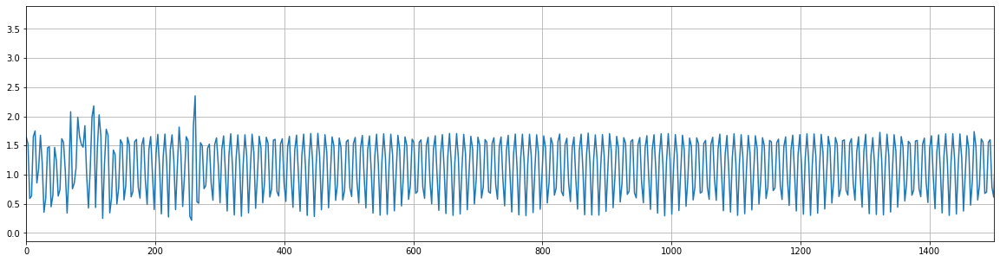

In [106]:
echo_signal = echo(s,1,fs)

w, h = sig.freqz(echo_signal, s, fs = fs, worN = 8000)
fig=plt.figure(figsize=(20,5))
plt.plot(w, np.abs(h))
plt.xlim(0,1500)
plt.grid()


**Answer to question in Task T10:**

<span style="font-weight:bold;color:orange">
    A comb filter is called this because all of the ridges in the graph duck down and up like a comb
</span>

### 4.9 Flanger 

It is possible to use an LFO to vary the delay. The resulting effect is known as a *flanger*.

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T11:**
    
* Add an LFO to your ‘delay’ to create a ‘flanger’, and experiment with different settings. Note that you will need to scale the output of the LFO, and you will get different effects depending on whether the delayed signal is mixed with the original or not.
</div>

In [117]:
def flanger(signal, speed_hz, depth, num_samples, fs , square_curve):
  length = len(signal)
  n = np.array(range(length))

  index = np.around(n-fs*(lfo(speed_hz, depth, 928086, fs, square_curve)))
  index[index<0] = 0
  index[index>(length-1)] = length-1 

  output=np.zeros(length)
  for j in range (length):
    output[j]=np.float(signal[j]+np.float(signal[int(index[j])]))
  return output


In [118]:
t = np.arange(0,StopTime,dt)

flanged = flanger(s,10,0.1,num_samples,fs,False)
ipd.Audio(flanged,rate = fs)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()


## 5 Frequency Analysis

<br>
<div style="border: 2px solid #999; padding: 10px; background: #9696ff;">
    
**Question Q5:**

* COM3502-4502-6502: 
    * What does FFT stand for and what does an FFT do?
* COM4502-6502 ONLY: What is a DFT and how is it different from an FFT?
    
</div>

**Answer to Question Q5:**

<span style="font-weight:bold;color:orange">
    FFT stands for "Fast Fourier Transform" and this is an algorithm to quickly calculate the discrete Fourier transform of a sequence
</span>

## Creating the Spectrogram Step-by-Step (for COM4502-6502 only)

The magnitude $|X[n, \ell]|$ of the STFT for all $n$ and $\ell$ is known as the [spectrogram](https://en.wikipedia.org/wiki/Spectrogram) of a signal. It is frequently used to analyze signals in the time-frequency domain, for instance by a [spectrum analyzer](https://en.wikipedia.org/wiki/Spectrum_analyzer). It can be interpreted as a *image* of the signal with (block) time direction on the $x$ axis and (discrete) frequency $n$ on the y axis.

From Lab Sheet 3 we already know how to brack a long signal into block, a.k.a. frames.

<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task 12: Manual Spectrogram Calculation (for COM4502-6502 only)**
    
<ul>
    <li> 
        Implement a function <code>calc_SpectralPoint(xk,n)</code> which calculates a spectral point for one discrete frequency $n$ from a input frame $x[k]$, i.e. a function which implements the well-known DFT equation
    $$
    \mathrm{DFT}\{x[k]\}   =  X[n] = \frac{1}{L_{\mathrm{DFT}}} \sum \limits_{k=0}^{L_{\mathrm{DFT}}-1} x[k]  e^{j 2 \pi k n /L_{\mathrm{DFT}}}
    $$ 
    for one fixed $n$.
    </li>
    <li> 
        Implement a very similar function <code>calc_SpectralPointWindowed(xk,n)</code> which calculates a spectral point for one discrete frequency $n$ from a input frame $x[k]$, but in addition applies a window function $w[k]$ to the frame $x[k]$, i.e. the function should calculate
    $$
    \mathrm{DFT}\{w[k] \cdot x[k]\}   =  X^{\mathrm{w}}[n] = \frac{1}{L_{\mathrm{DFT}}} \sum \limits_{k=0}^{L_{\mathrm{DFT}}-1} w[k] x[k]  e^{j 2 \pi k n /L_{\mathrm{DFT}}}
    $$ 
    for one fixed $n$. The window should have the same length $L_{\mathrm{DFT}}$ as your frame and should be one of the windows we discussed during the lecture.
    </li>
    <li> 
        The functions above only calculates one spectral value at a time. To obtain a full spectrum , implement a function <code>calc_Manitude_Spectrum()</code> which transforms every windowed frame to the frequency domain and calculates all positive frequencies, i.e. for $0 \leq n \leq L_{\mathrm{DFT}}/2+1$.
    </li>
    <li> 
        Create a function <code>create_spectrogram()</code>, which splits the complete input sequence (e.g. a loaded WAVE file) into blocks of length $L_{\mathrm{DFT}}$. These may be overlapping. For each block the spectrum should be calculated using the previously implemented function <code>calc_Manitude_Spectrum()</code> and all spectra should be collected to form a spectrogram (e.g. as columns of a matrix).
    </li>
    <li> 
        Concatenate the resulting spectra to a spectrogram and display the resulting spectrogram. You can use <code>matplotlib</code>'s <code><a href="https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html">imshow()</a></code> function for manually plotting the spectrogram image. Note that a spectrogram is usally shown in dB scaling.
    </li>
    <li>
        Visulalise the input signal $x[k]$ as spectrogram for (i) a speech signal and (ii) for a chirp/sweep signal. 
    </li>
</ul>
</div>

Implement the  DFT equation
    $$\mathrm{DFT}\{x[k]\}   =  X[n] = \frac{1}{L_{\mathrm{DFT}}} \sum \limits_{k=0}^{L_{\mathrm{DFT}}-1} x[k]  e^{j 2 \pi k n /L_{\mathrm{DFT}}}$$ for one fixed $n$:

In [109]:
def calc_SpectralPoint(xk,n):
    '''
    Implementation of the Discrete Fourier Transform (DFT).
    Calculates the Fourier coefficient X[n] for one discrete frequency n 
    
    Input: 
    xk:     time domain signal vector
    n:      discrecte frequency to be calculated
    
    Output 
    Xn : dicrete frequency domain point for frequency n
    '''
    
    # Your code here
    # ...

Implement DFT of windowed frame
$$\mathrm{DFT}\{w[k] \cdot x[k]\}   =  X^{\mathrm{w}}[n]  = \frac{1}{L_{\mathrm{DFT}}} \sum \limits_{k=0}^{L_{\mathrm{DFT}}-1} w[k] x[k]  e^{j 2 \pi k n /L_{\mathrm{DFT}}}$$ for one fixed $n$. 

In [110]:
def calc_SpectralPointWindowed(xk,n,window=False):
    '''
    Implementation of the Discrete Fourier Transform (DFT).
    Calculates the Fourier coefficient X[n] for one discrete frequency n 
    
    Input: 
    xk:     time domain signal vector
    n:      discrecte frequency to be calculated
    window: (optional): can be False (no window) or a window name from   
            the list of available numpy window functions, e.g. 
            np.hamming, np.bartlett, np.blackman, np.hanning, np.kaiser
            type: function
            (feel free to implement the window differently)
    
    Output 
    Xn : dicrete frequency domain point for frequency n
    '''
    # Your code here
    # L_DFT = ???
    # ...
    
    if window == False:
        win = np.ones(L_DFT) # this is a window with no effect
    else:
        None # replace this by your own window
        
    # Your code here
    # ...

The following function <code>calc_Manitude_Spectrum()</code> is supposed to transform every (windowed or not windowed) frame to the frequency domain and to calculate all positive frequencies, i.e. $X[n]$ or $X^{\mathrm{w}}[n]$ for $0 \leq n \leq L_{\mathrm{DFT}}/2+1$.

In [111]:
def calc_Manitude_Spectrum(xk):
    '''
    Compute Fourier coefficients up to the Nyquest Limit (fs/2), i.e. Xn for n=0,...,L_DFT/2 
    using one of the two functions created before.
    and multiply the absolute value of the Fourier coefficients by 2, 
    to account for the symetry of the Fourier coefficients above the Nyquest Limit. 
    '''
    # Your code here
    # ...
    
    # probably there should be a loop over n here

The following function <code>create_spectrogram()</code> should calculate all spectra needed for your spectrogram. 

In [112]:
def create_spectrogram(x, L_DFT=512, noverlap):
    '''
           x: original time series
       L_DFT: The number of data points used in each block for the DFT. The default value is 512. 
    noverlap: The number of points of overlap between blocks. The default value is 256. 
    '''
    # Your code here
    # ...
    


SyntaxError: ignored

The following function can be used to actually display the created spectrogram.

In [ ]:
def plot_spectrogram( #...

The following code actually calculates and plots your spectrogram (for the two signals mentioned above). Feel free to adapt parameters `L_DFT` and `noverlap`

In [ ]:
# load or create signal

# create and plot spectrogram (generated using your functions above)
L_DFT    = 256 # DFT length
noverlap = 84  # number of overlapping samples
starts, spec = create_spectrogram( #...
plot_spectrogram(#...

## 6 Equaliser (for COM4502-6502 only)

We want to design an equaliser like shown in the picture below as a hardware system.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/f/fa/Yamaha_EQ-500_Graphic_Equalizer.jpg/1920px-Yamaha_EQ-500_Graphic_Equalizer.jpg" align="center" style="width: 500px;"/>
<center><span style="font-size:smaller">
    Picture taken from <a href="https://simple.wikipedia.org/wiki/Equalization_(audio)">Wikipedia</a>, license: <a href="https://creativecommons.org/licenses/by/2.0/">CC BY 2.0</a>
</span></center>


The following function realises one of the sliders in software.

In [ ]:
def peaking_filter(gain,center_freq,q,fs):
    """
    Derive coefficients for a peaking filter with a given amplitude and
     bandwidth.  All coefficients are calculated as described in Zolzer's
     DAFX book (p. 50 - 55).  This algorithm assumes a constant q-term
     is used through the equation.
    
    Usage:     `b,a` = peaking_filter(gain,center_freq, q,fs)
                `gain` is the logrithmic gain (in dB)
                `center_freq` is the center frequency
                `q` is q-term equating to (Fb / Fc)
                `fs` is the sampling rate
    
    Author:    Jeff Tackett 08/22/05
    Port to Python by George Close 10/07/21
    """
    
    gain = np.float32(gain)
    k = np.tan((np.pi*center_freq)/fs)
    V0 = 10**((gain)/20)
    # invert gain if a cut
    if V0 < 1:
        V0 = 1/V0

    # Boost
    if gain > 0:
        b0 = (1 + ((V0/q)*k)+ k**2) / (1+((1/q)*k)+k**2)
        b1 = (2 * (k**2 - 1)) / (1 + ((1/q)*k) + k**2);
        b2 = (1 - ((V0/q)*k) + k**2) / (1 + ((1/q)*k) + k**2);
        a1 = b1;
        a2 =  (1 - ((1/q)*k) + k**2) / (1 + ((1/q)*k) + k**2);
    # Cut
    elif gain <0:
        b0 = (1 + ((1/q)*k) + k**2) / (1 + ((V0/q)*k) + k**2);
        b1 =       (2 * (k**2 - 1)) / (1 + ((V0/q)*k) + k**2);
        b2 = (1 - ((1/q)*k) + k**2) / (1 + ((V0/q)*k) + k**2);
        a1 = b1;
        a2 = (1 - ((V0/q)*k) + k**2) / (1 + ((V0/q)*k) + k**2);
    #gain is 0
    else:
        b0 = V0;
        b1 = 0;
        b2 = 0;
        a1 = 0;
        a2 = 0;
    a = [  1, a1, a2];
    b = [ b0, b1, b2];
    return b,a

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T13: (for COM4502-6502 only)**
    
* Visualise the frequency response of one filter.
* Implement a cascade of filters to realise an equaliser.
* Visualise the frequency response of your equaliser filter and the input and (filtered) output signal.
    
</div>

In [ ]:
# Your code here 
#
# ...

## 6. Prepare for submission

<br>
<div style="border: 2px solid #999; padding: 10px; background: #abe;">
    
**Task T14:**
 
* Clear all cell outputs to reduce the file size (in Jupyter Notebooks clivk on "Cell->All Output->Clear")
* Create a `.zip` file named `YourName.zip` containing this Jupyter Notebook files as well as all other file necessary to run this notebook (**if such exist**, e.g. if you created (additional) WAVE files). 
* Hand-in your `.zip` file via Blackboard.
    

<span style="font-weight:bold;color:red;text-align:center;">**Important: For marking, we expect your code to work ‘out of the box’.**</span> This means that no additional software should have to be installed to make the Notebook run. If you only used libraries known from the Speech Processing Lab classes, you should be safe here.
    
</div>